In [1]:
import crypto.simon

In [2]:
crypto.simon.check_testvector()

Ciphertext: (50843, 59835)
Testvector verified.


True

In [3]:
import dataset
import pca_helper
import numpy as np
import clustering_helper

In [4]:
dataset_generator = dataset.DatasetGenerator(alg='simon_32_64')
dimension = 2
nr = 8
datasize = 100000
lambda_base = 1/64
t0 = 0.1 * lambda_base
eigenvalue_ratios = np.zeros((32,64), dtype=float)
eigenvalue_vectors = np.zeros((32,64,64), dtype=float)
projected_data = np.zeros((32, datasize, dimension))
labels = np.zeros((32,datasize,))
silhouette_score = np.zeros((32))

* input_diff = (0x0000, 0x0001)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.0042789194710615985


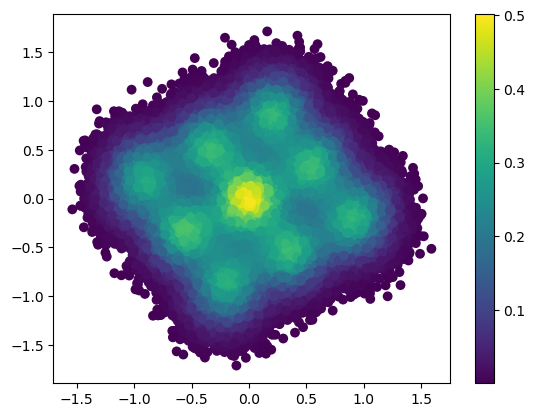

   - silhouette score: 0.389277814237964


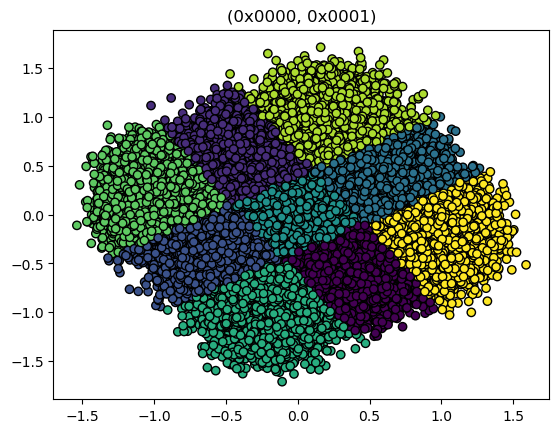

* input_diff = (0x0000, 0x0002)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004339577133430243


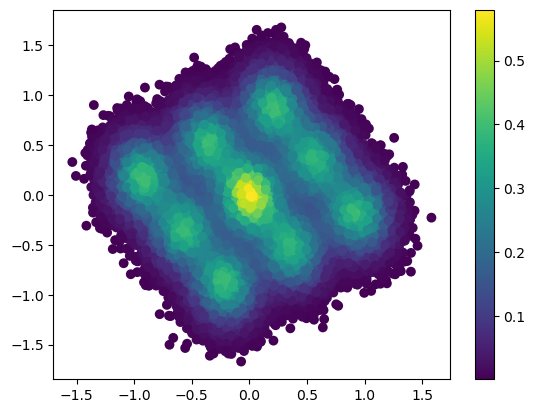

   - silhouette score: 0.4270163920277929


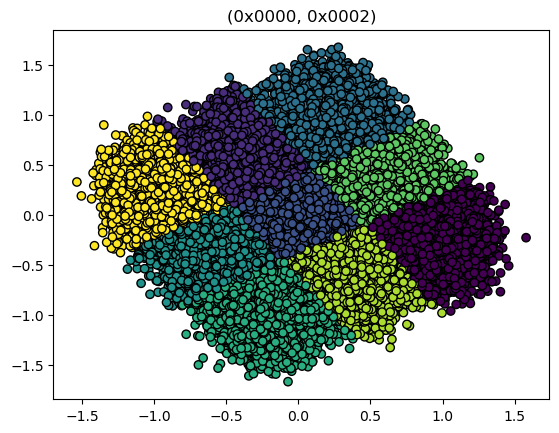

* input_diff = (0x0000, 0x0004)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004448341197183146


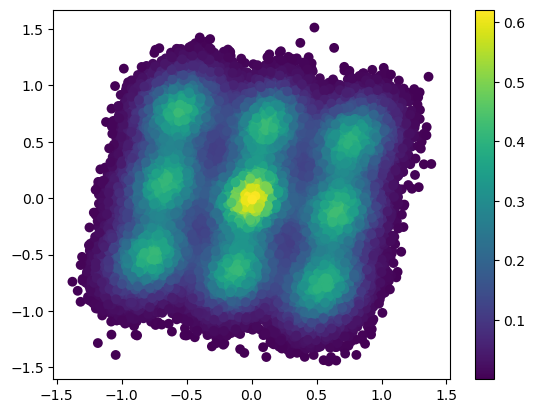

   - silhouette score: 0.4506425141314446


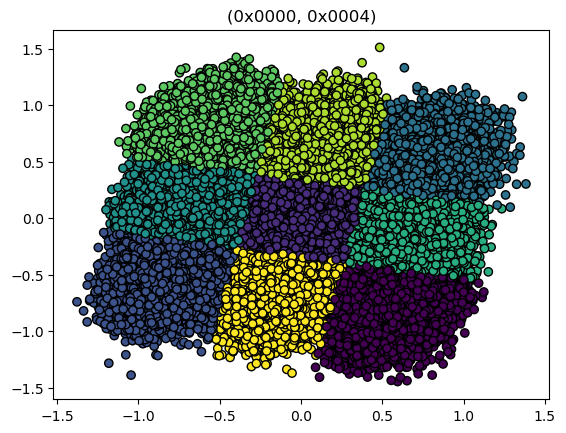

* input_diff = (0x0000, 0x0008)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004380879864808899


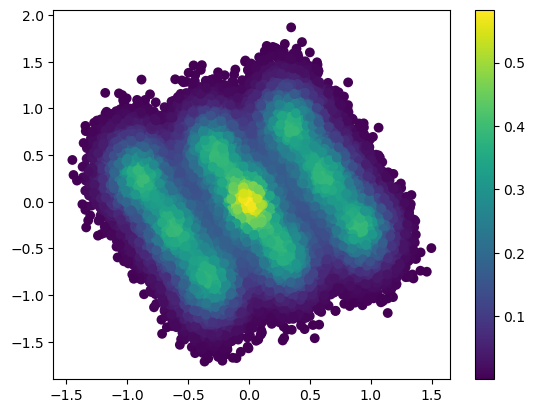

   - silhouette score: 0.4224907051765705


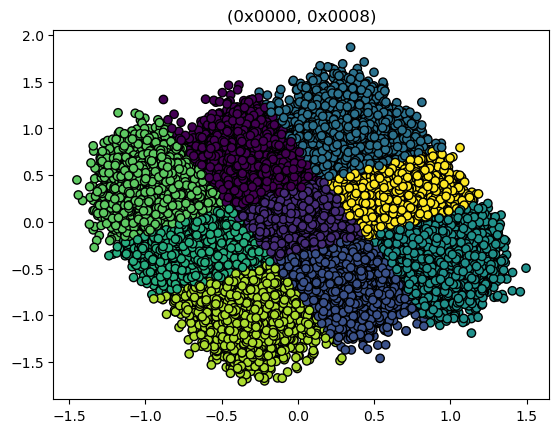

* input_diff = (0x0000, 0x0010)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004336177847066133


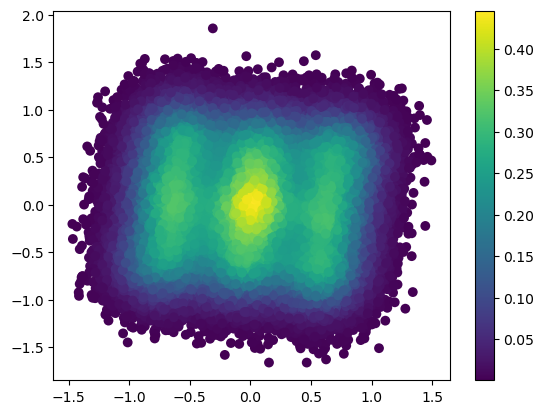

   - silhouette score: 0.3569221967618512


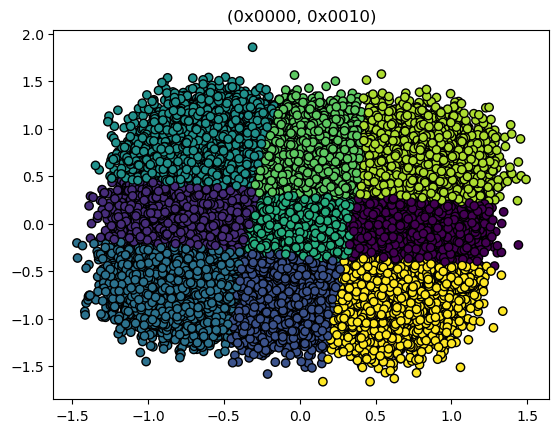

* input_diff = (0x0000, 0x0020)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004394449544127318


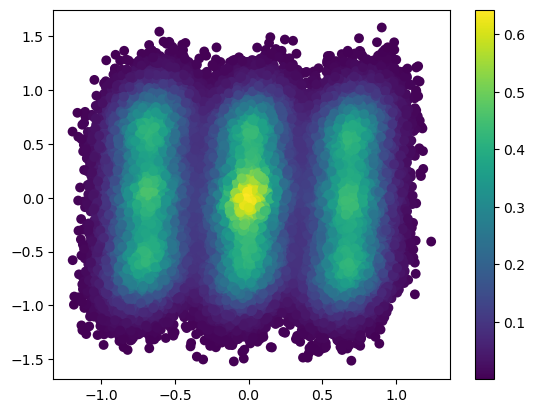

   - silhouette score: 0.4479053350104697


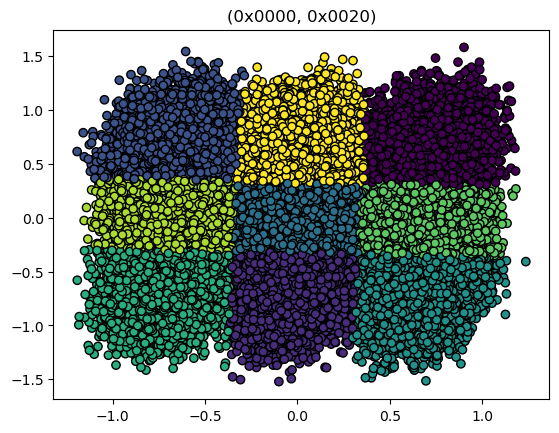

* input_diff = (0x0000, 0x0040)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004300705122704803


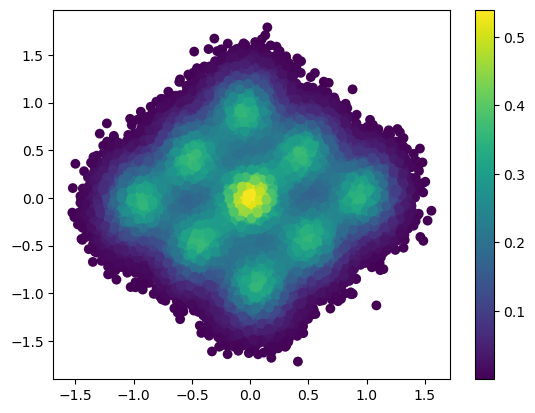

   - silhouette score: 0.4065294908124262


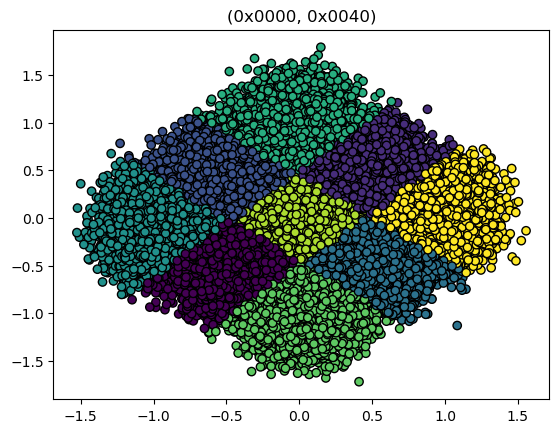

* input_diff = (0x0000, 0x0080)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.0042887162944602285


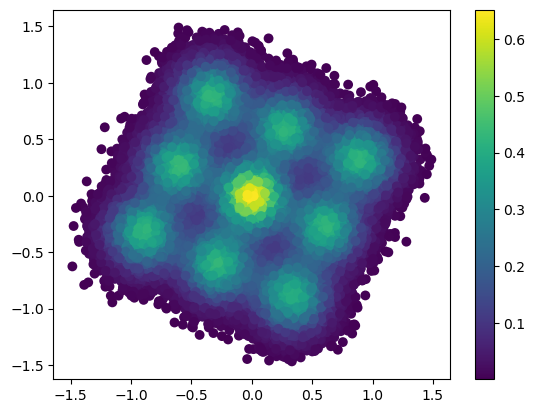

   - silhouette score: 0.45911430745265985


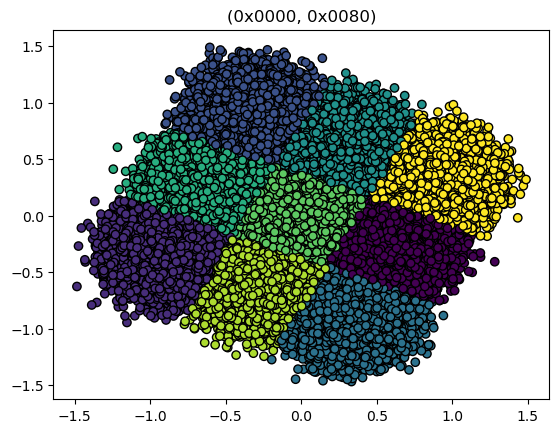

* input_diff = (0x0000, 0x0100)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004259864047308673


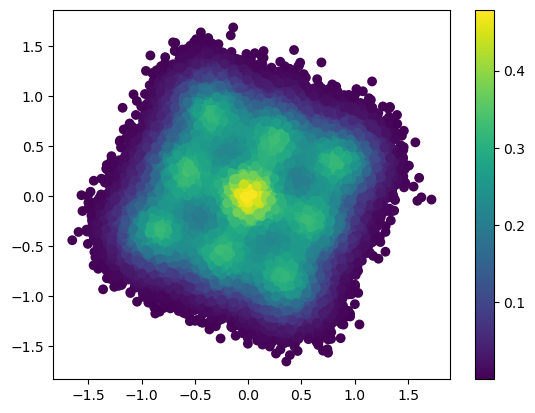

   - silhouette score: 0.3800069524860996


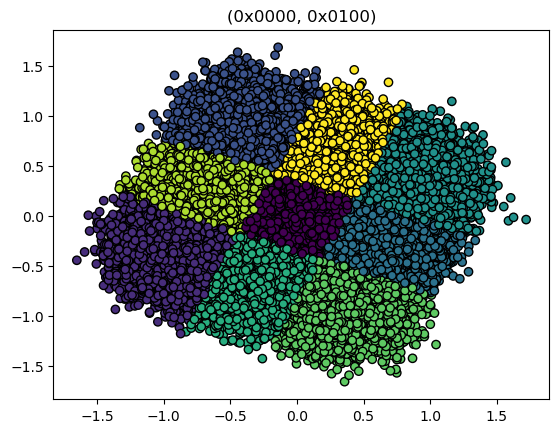

* input_diff = (0x0000, 0x0200)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004319628056122238


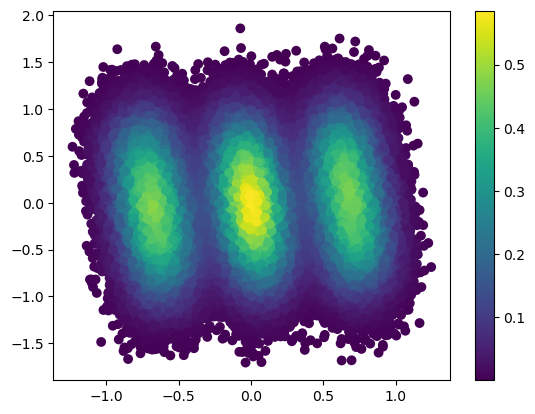

   - silhouette score: 0.40906209327106147


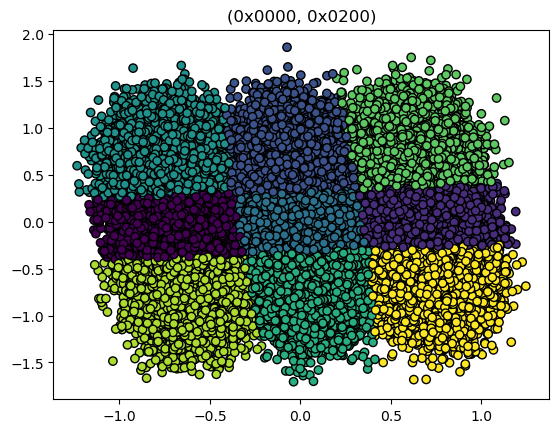

* input_diff = (0x0000, 0x0400)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004300417273340688


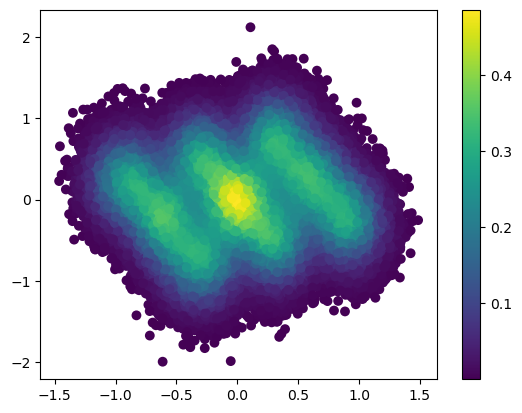

   - silhouette score: 0.36667333320070045


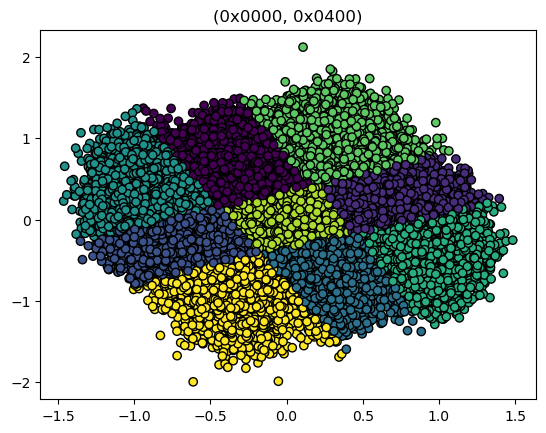

* input_diff = (0x0000, 0x0800)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004381316329890517


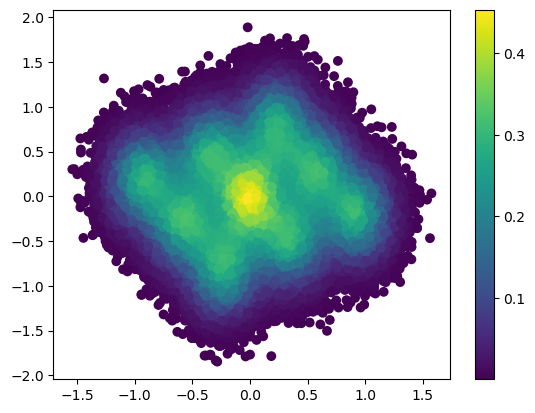

   - silhouette score: 0.35852532642649443


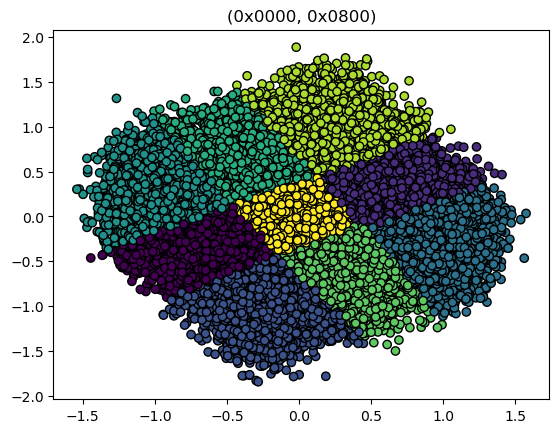

* input_diff = (0x0000, 0x1000)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004317504598047965


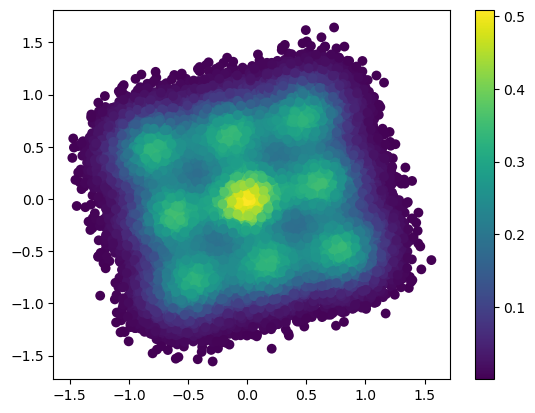

   - silhouette score: 0.3958944630218834


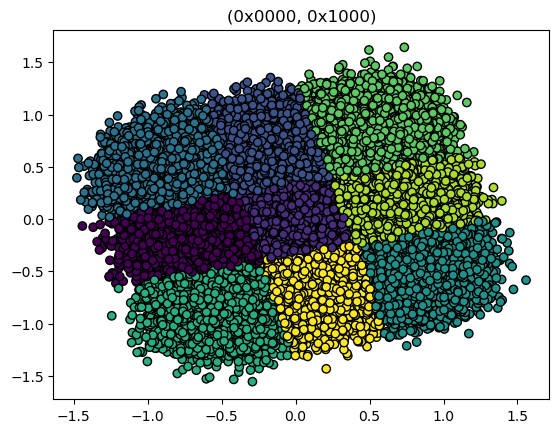

* input_diff = (0x0000, 0x2000)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004341015920777132


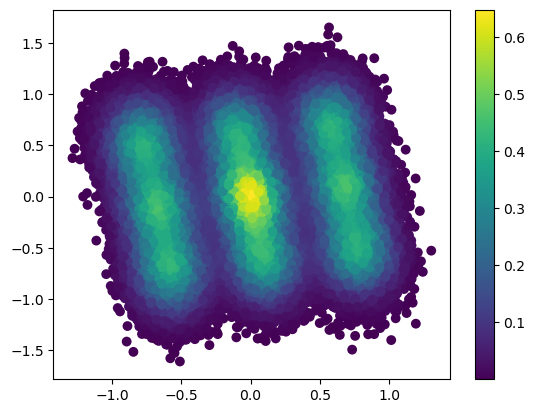

   - silhouette score: 0.4495855076541824


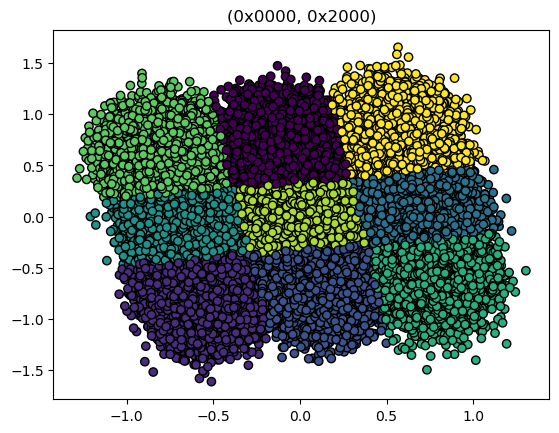

* input_diff = (0x0000, 0x4000)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.0042881587683998995


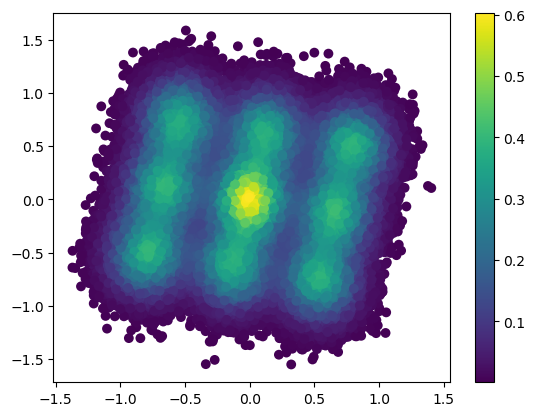

   - silhouette score: 0.4306344894940311


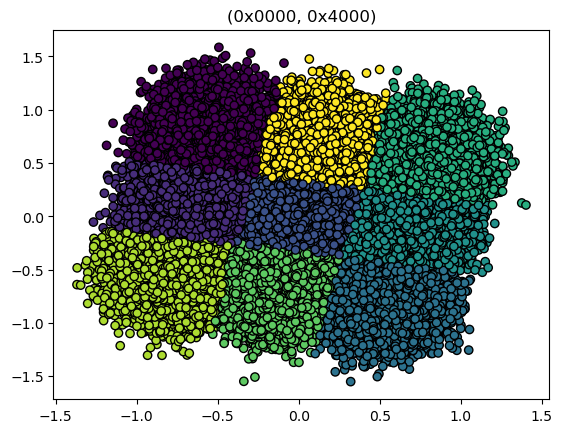

* input_diff = (0x0000, 0x8000)
   - threshold: 0.0015625, number of biased PCs: 6
   - largest rho - lambda_base: 0.004427616193220525


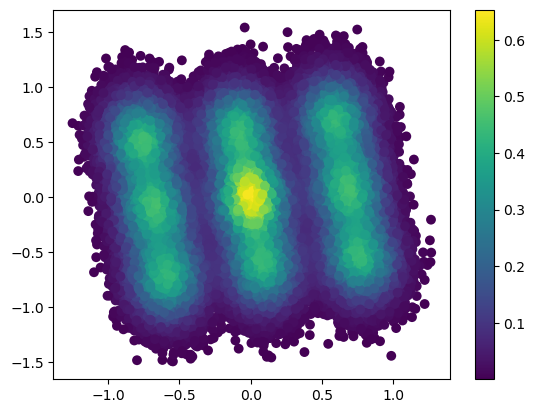

   - silhouette score: 0.46122421474225683


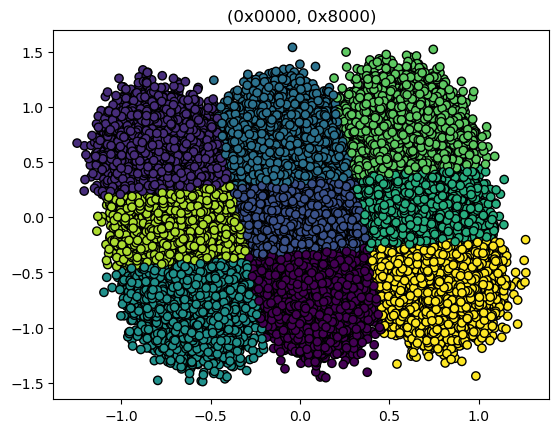

In [5]:
# rightside word, hw=1
for i in range(16):
    input_diff = (0x0, 1 << i)
    input_diff_str = f'(0x{input_diff[0]:04X}, 0x{input_diff[1]:04X})'
    print(f'* input_diff = {input_diff_str}')

    speck_nr5 = dataset_generator.gen_real_dataset(input_diff, nr, datasize)

    eigenvalue_ratio, eigenvector = pca_helper.EigenValueDecomposition(dataset=speck_nr5)
    eigenvalue_ratios[i] = eigenvalue_ratio
    eigenvalue_vectors[i] = eigenvector

    print(f'   - threshold: {t0}, number of biased PCs: {sum(abs(eigenvalue_ratios[i] - lambda_base) > t0)}')
    print(f'   - largest rho - lambda_base: {max(eigenvalue_ratios[i]) - lambda_base}')

    
    projected_data[i] = pca_helper.DimensionReduction(dataset=speck_nr5, title=input_diff_str, n_components=dimension)
    
    pca_helper.Visualize2D(pca_results_2D=projected_data[i], title=input_diff_str)

    labels[i] = clustering_helper.kmeans_clustering(data=projected_data[i], num_clusters=3**dimension)
    silhouette_score[i] = clustering_helper.calculate_silhouette(data=projected_data[i], labels=labels[i])
    print(f'   - silhouette score: {silhouette_score[i]}')
    clustering_helper.visualize_clusters_2D(projected_data[i], labels[i], title=input_diff_str)

* input_diff = (0x0001, 0x0000)


   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.002104944558154999


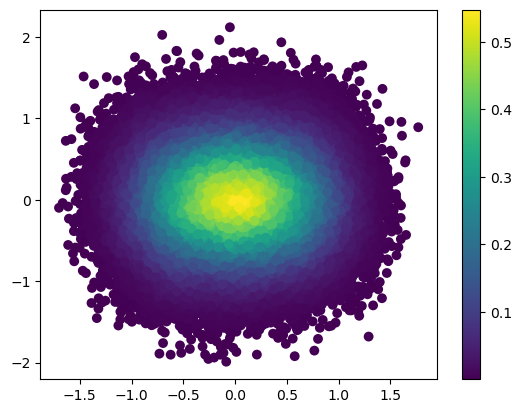

   - silhouette score: 0.31390159131857376


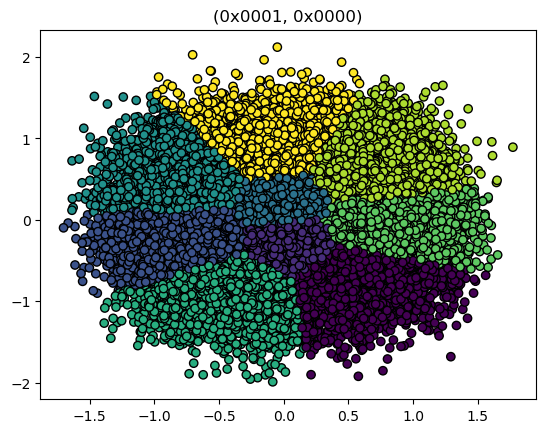

* input_diff = (0x0002, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021918755406328816


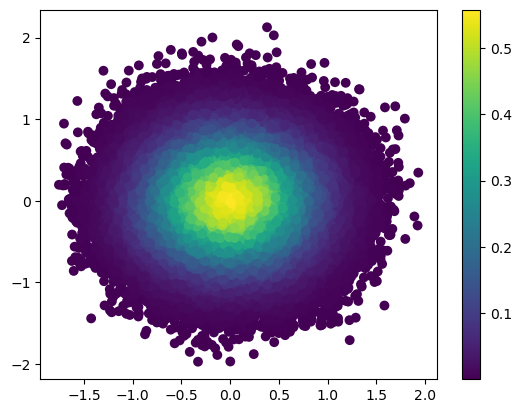

   - silhouette score: 0.30952927758942167


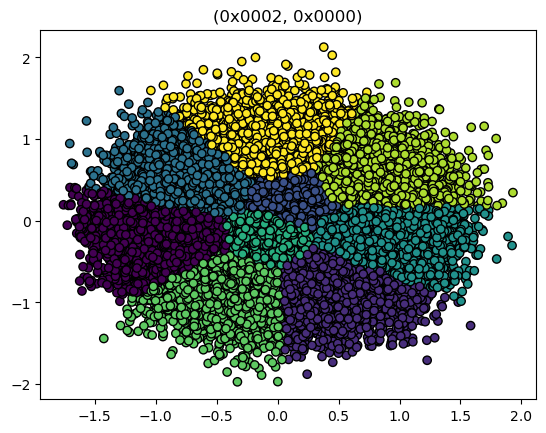

* input_diff = (0x0004, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021959819497196394


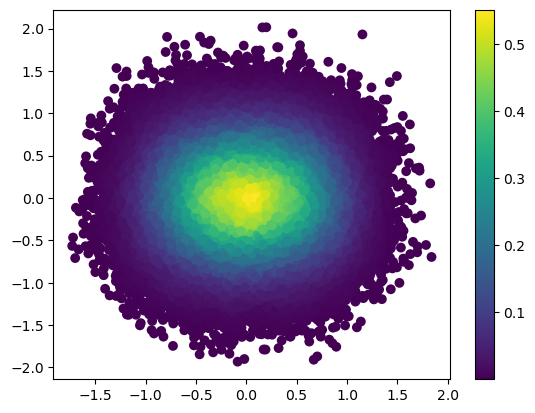

   - silhouette score: 0.3122594994756872


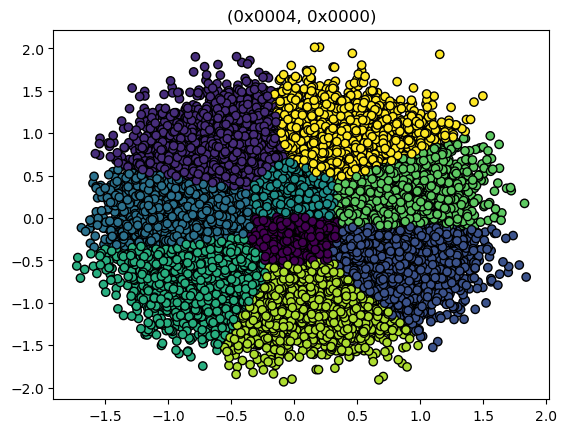

* input_diff = (0x0008, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.002006735055815015


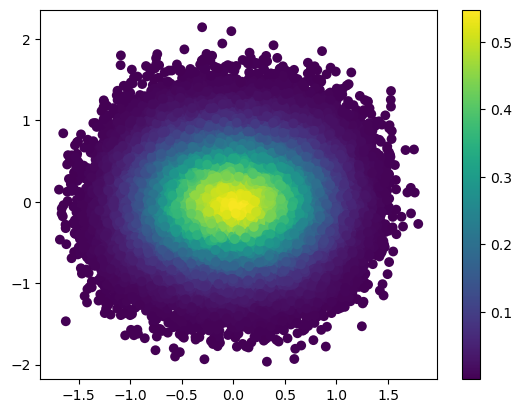

   - silhouette score: 0.31225485045638435


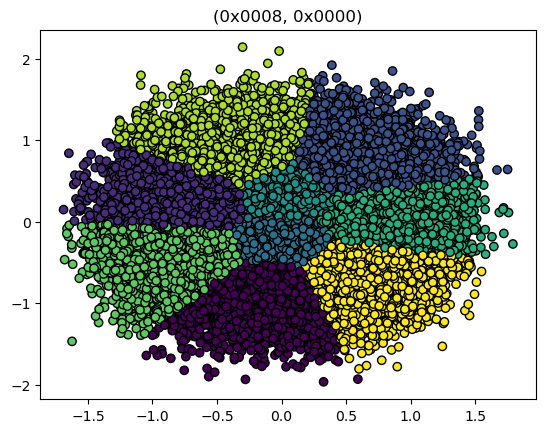

* input_diff = (0x0010, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0020532430767599974


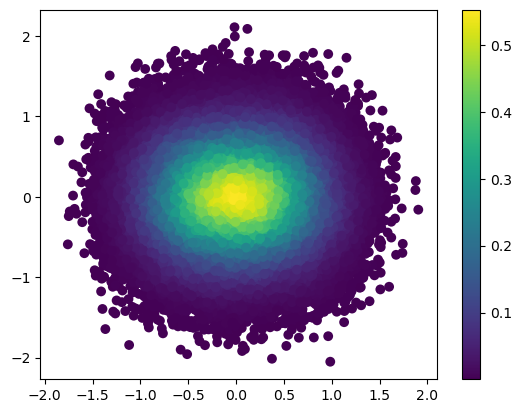

   - silhouette score: 0.31065027097472586


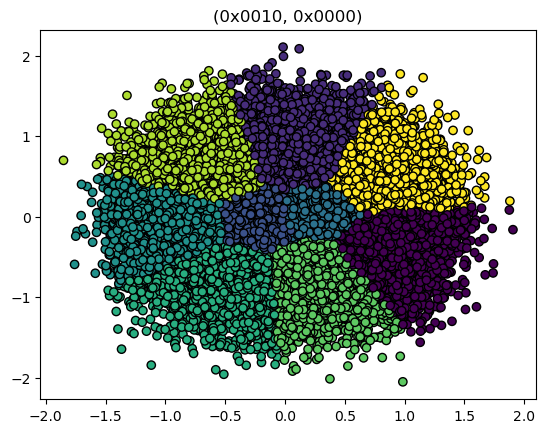

* input_diff = (0x0020, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.002161503185373923


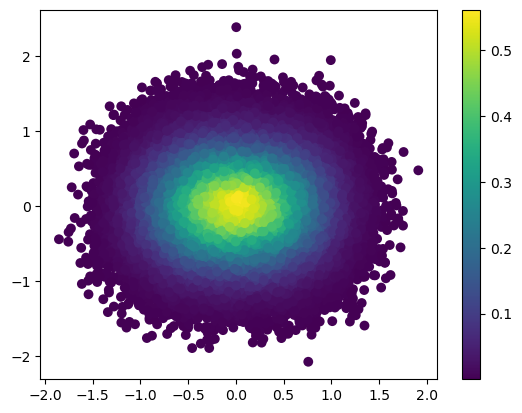

   - silhouette score: 0.3101073408231103


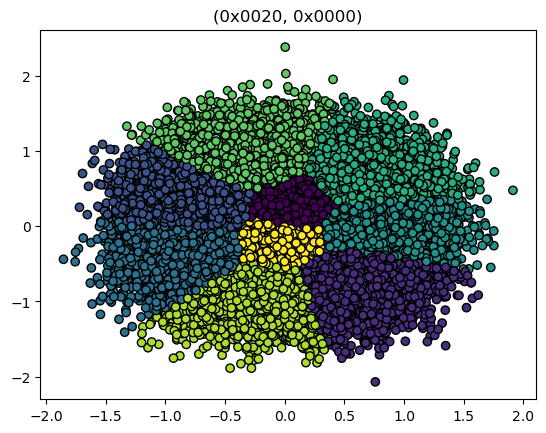

* input_diff = (0x0040, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0020688449414683757


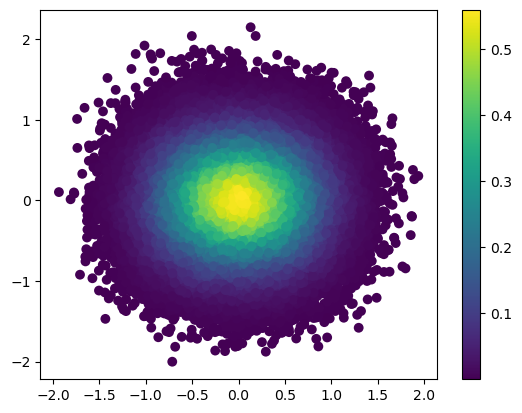

   - silhouette score: 0.3092764322262913


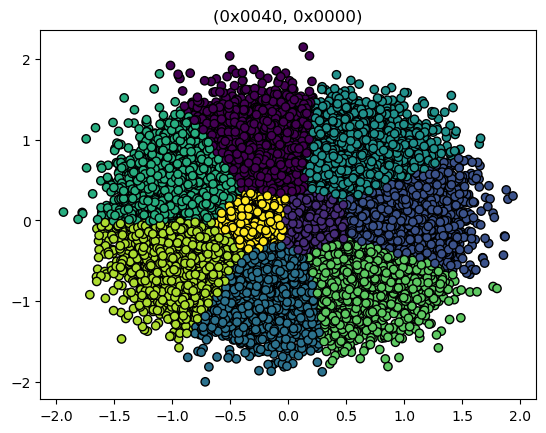

* input_diff = (0x0080, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0020323820766332684


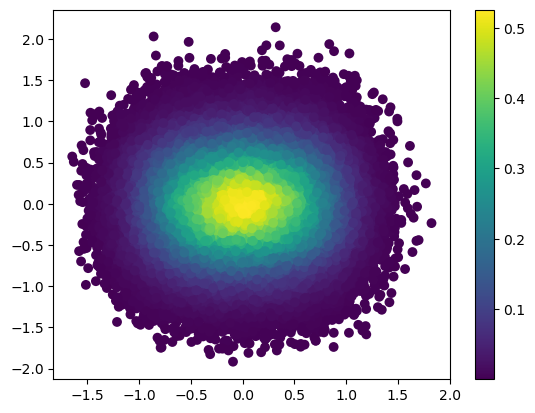

   - silhouette score: 0.3139077548303634


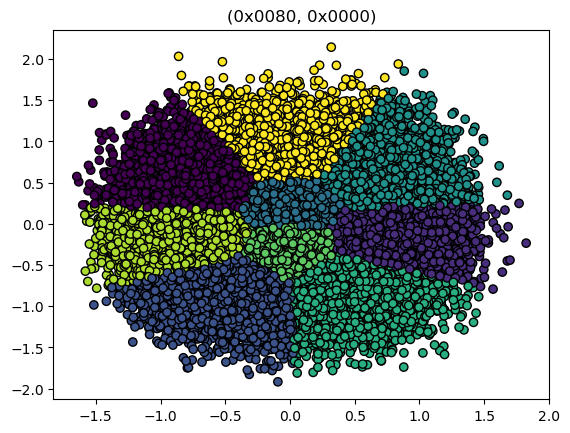

* input_diff = (0x0100, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021231765320879337


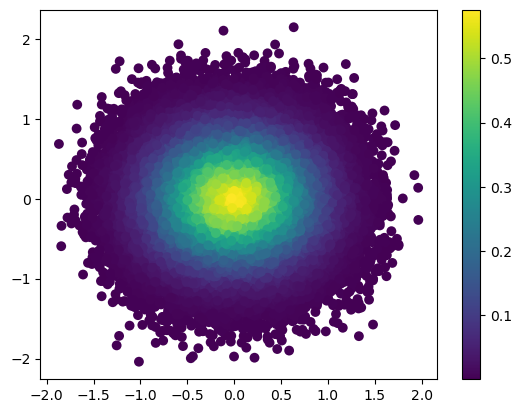

   - silhouette score: 0.30892133779871184


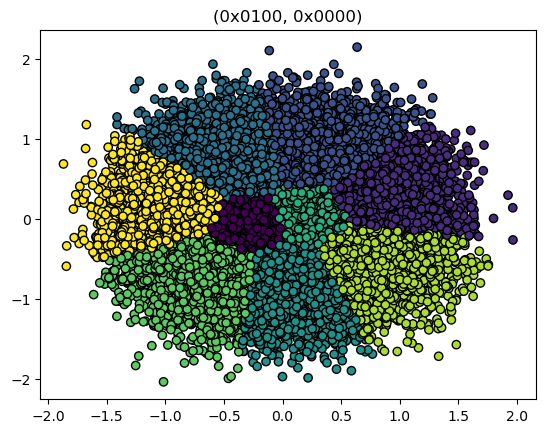

* input_diff = (0x0200, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0020903858735024927


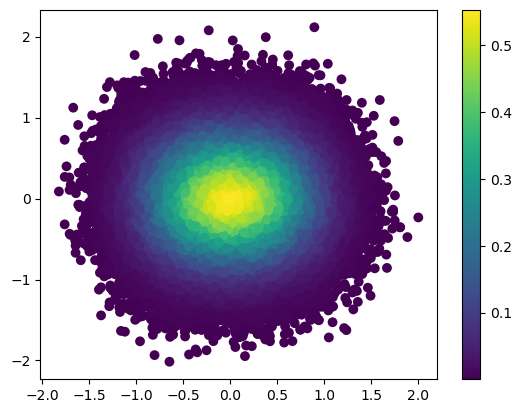

   - silhouette score: 0.30940879011080114


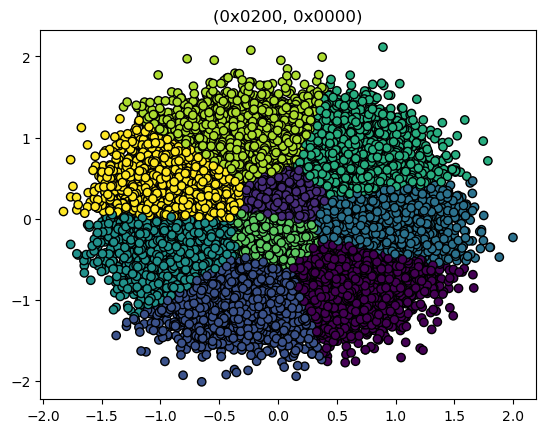

* input_diff = (0x0400, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0020268264700024977


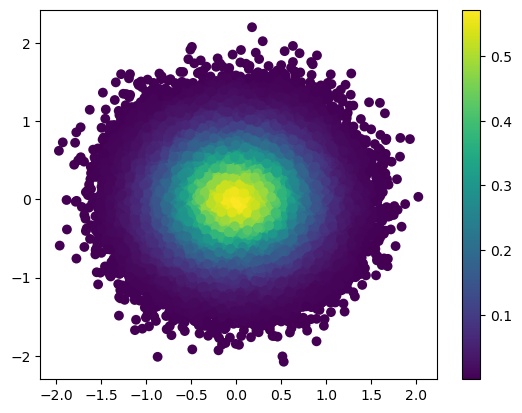

   - silhouette score: 0.3122618856694843


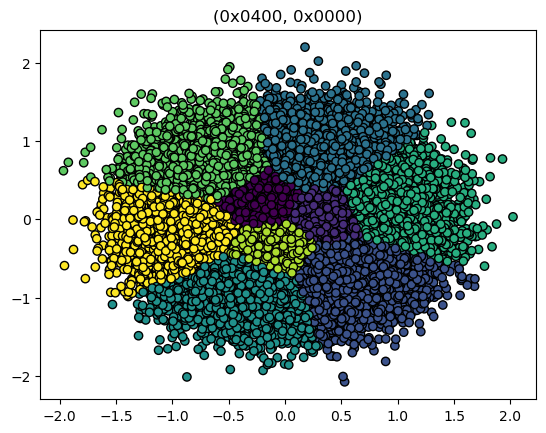

* input_diff = (0x0800, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021614810815123106


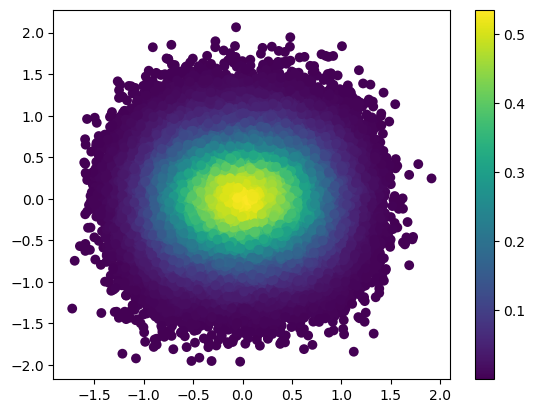

   - silhouette score: 0.31324910791440247


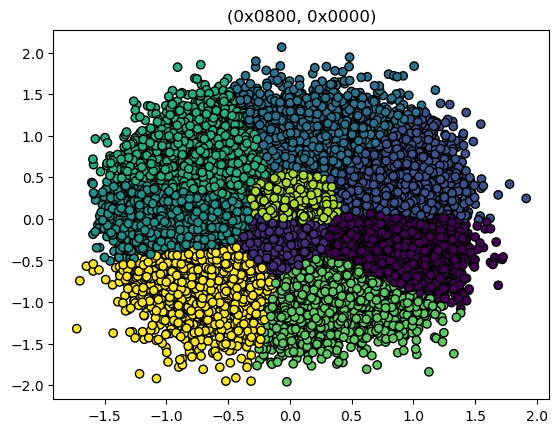

* input_diff = (0x1000, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021371098418474024


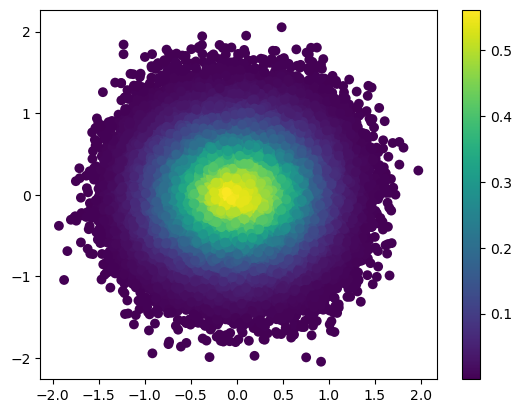

   - silhouette score: 0.31419381114519973


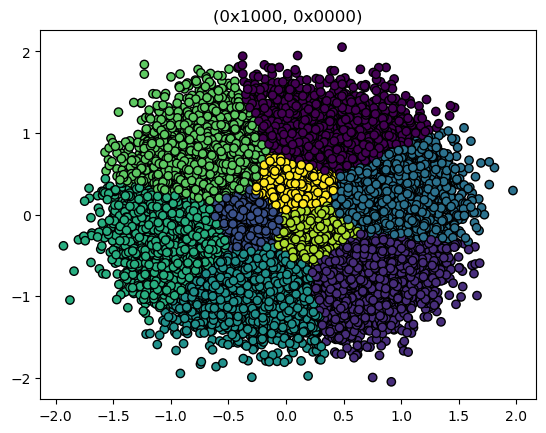

* input_diff = (0x2000, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.002084115646007686


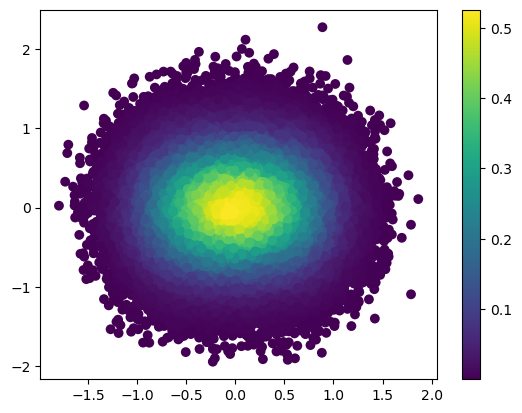

   - silhouette score: 0.31295538336983375


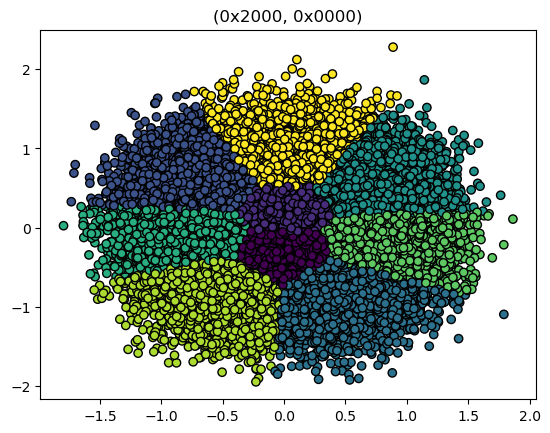

* input_diff = (0x4000, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.0021449251456206048


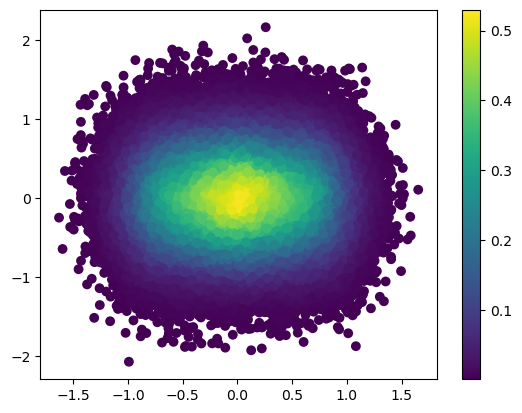

   - silhouette score: 0.3202375988982296


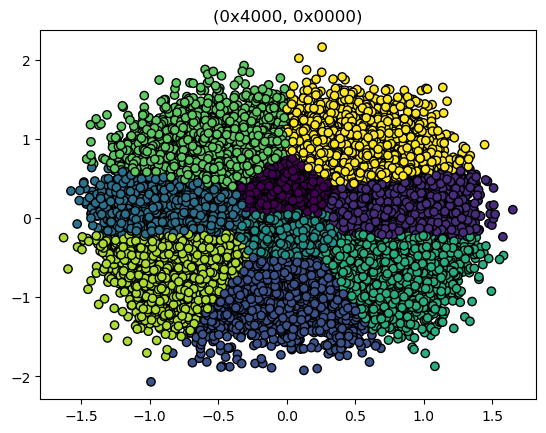

* input_diff = (0x8000, 0x0000)
   - threshold: 0.0015625, number of biased PCs: 2
   - largest rho - lambda_base: 0.002085723916216243


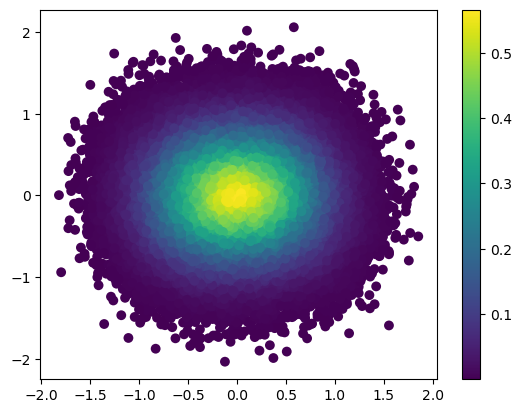

   - silhouette score: 0.3092994280874967


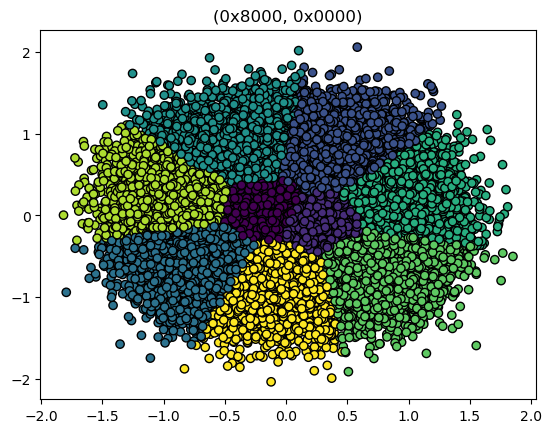

In [6]:
# leftside word, hw=1
for i in range(16):
    input_diff = (1 << i, 0x0)
    input_diff_str = f'(0x{input_diff[0]:04X}, 0x{input_diff[1]:04X})'
    print(f'* input_diff = {input_diff_str}')

    speck_nr5 = dataset_generator.gen_real_dataset(input_diff, nr, datasize)

    eigenvalue_ratio, eigenvector = pca_helper.EigenValueDecomposition(dataset=speck_nr5)
    eigenvalue_ratios[i+16] = eigenvalue_ratio
    eigenvalue_vectors[i+16] = eigenvector

    print(f'   - threshold: {t0}, number of biased PCs: {sum(abs(eigenvalue_ratios[i+16] - lambda_base) > t0)}')
    print(f'   - largest rho - lambda_base: {max(eigenvalue_ratios[i+16]) - lambda_base}')

    
    projected_data[i+16] = pca_helper.DimensionReduction(dataset=speck_nr5, title=input_diff_str, n_components=dimension)
    
    pca_helper.Visualize2D(pca_results_2D=projected_data[i+16], title=input_diff_str)

    labels[i+16] = clustering_helper.kmeans_clustering(data=projected_data[i+16], num_clusters=3**dimension)
    silhouette_score[i+16] = clustering_helper.calculate_silhouette(data=projected_data[i+16], labels=labels[i+16])
    print(f'   - silhouette score: {silhouette_score[i+16]}')
    clustering_helper.visualize_clusters_2D(projected_data[i+16], labels[i+16], title=input_diff_str)

In [7]:
np.save('simon_eigenvalue_ratios.npy', eigenvalue_ratios)
np.save('simon_eigenvalue_vectors.npy', eigenvalue_vectors)
np.save('simon_projected_data.npy', projected_data)
np.save('simon_labels.npy', labels)
np.save('simon_silhouette_score.npy', silhouette_score)

In [10]:
for i in range(32):
    print(f'i: 0x{format((1<<i), "08x")}, The number of siginificant rho: {sum(abs(eigenvalue_ratios[i] - lambda_base) > (0.1*lambda_base))}, max_diff: {round(max(abs(eigenvalue_ratios[i] - lambda_base)), 5)}')

i: 0x00000001, The number of siginificant rho: 6, max_diff: 0.00428
i: 0x00000002, The number of siginificant rho: 6, max_diff: 0.00434
i: 0x00000004, The number of siginificant rho: 6, max_diff: 0.00445
i: 0x00000008, The number of siginificant rho: 6, max_diff: 0.00438
i: 0x00000010, The number of siginificant rho: 6, max_diff: 0.00434
i: 0x00000020, The number of siginificant rho: 6, max_diff: 0.00439
i: 0x00000040, The number of siginificant rho: 6, max_diff: 0.0043
i: 0x00000080, The number of siginificant rho: 6, max_diff: 0.00429
i: 0x00000100, The number of siginificant rho: 6, max_diff: 0.00427
i: 0x00000200, The number of siginificant rho: 6, max_diff: 0.00432
i: 0x00000400, The number of siginificant rho: 6, max_diff: 0.00432
i: 0x00000800, The number of siginificant rho: 6, max_diff: 0.00438
i: 0x00001000, The number of siginificant rho: 6, max_diff: 0.00432
i: 0x00002000, The number of siginificant rho: 6, max_diff: 0.00434
i: 0x00004000, The number of siginificant rho: 6,

In [6]:
np.save('eigenvalue_raito_speck_nr5_1000000_re.npy', eigenvalue_ratio)

In [24]:
np.set_printoptions(suppress=False)
arounded_rho_00400000 = np.around(eigenvalue_ratios[22]-lambda_base, 5)

for i in range(len(arounded_rho_00400000)):
    print(arounded_rho_00400000[i])

0.01195
0.01013
0.00842
0.00587
0.00553
0.00476
0.00337
0.00306
0.0019
0.001
0.0008
0.00079
0.00074
0.00054
0.00036
0.00025
0.00022
0.00017
0.00016
0.00016
0.00014
0.00011
0.0001
9e-05
6e-05
6e-05
5e-05
4e-05
3e-05
2e-05
2e-05
-0.0
-1e-05
-2e-05
-3e-05
-3e-05
-5e-05
-6e-05
-7e-05
-8e-05
-8e-05
-9e-05
-0.00011
-0.00014
-0.00014
-0.00015
-0.00018
-0.00021
-0.00026
-0.00038
-0.00053
-0.00074
-0.00076
-0.00082
-0.001
-0.00189
-0.00306
-0.00337
-0.00476
-0.00553
-0.00587
-0.00842
-0.01013
-0.01195


In [11]:
arounded_eigenvalue_vectors = np.around(eigenvalue_vectors, 2)

In [14]:
# (0x0040, 0x000) Dataset's eigenvector
# The index of (0x0040, 0x000) Dataset: 22
# Top 8 eigenvectors' coefficients
for i in range(8):
    C0_l = arounded_eigenvalue_vectors[22][i][:16]
    C0_r = arounded_eigenvalue_vectors[22][i][16:32]
    C1_l = arounded_eigenvalue_vectors[22][i][32:48]
    C1_r = arounded_eigenvalue_vectors[22][i][48:]
    print(f'PC{i}-C0_l: {C0_l}')
    print(f'PC{i}-C0_r: {C0_r}')
    print(f'PC{i}-C1_l: {C1_l}')
    print(f'PC{i}-C1_r: {C1_r}')


PC0-C0_l: [ 0.   -0.   -0.    0.   -0.    0.   -0.   -0.   -0.    0.   -0.    0.
  0.    0.   -0.71  0.  ]
PC0-C0_r: [ 0.   -0.    0.   -0.   -0.    0.   -0.   -0.   -0.    0.    0.    0.
  0.    0.   -0.01 -0.  ]
PC0-C1_l: [ 0.   -0.   -0.    0.   -0.   -0.   -0.   -0.   -0.    0.    0.   -0.
 -0.    0.    0.71  0.  ]
PC0-C1_r: [-0.    0.   -0.   -0.    0.   -0.    0.   -0.   -0.    0.    0.   -0.
 -0.   -0.   -0.01 -0.  ]
PC1-C0_l: [ 0.    0.   -0.   -0.    0.   -0.   -0.   -0.    0.    0.   -0.    0.
 -0.   -0.    0.    0.71]
PC1-C0_r: [-0.    0.   -0.    0.    0.    0.   -0.   -0.   -0.   -0.   -0.    0.
  0.   -0.    0.01  0.  ]
PC1-C1_l: [-0.    0.   -0.   -0.   -0.   -0.    0.    0.    0.   -0.    0.    0.
  0.   -0.   -0.    0.71]
PC1-C1_r: [-0.    0.    0.    0.   -0.    0.   -0.   -0.    0.   -0.   -0.    0.
 -0.    0.    0.01  0.  ]
PC2-C0_l: [-0.   -0.   -0.    0.   -0.   -0.   -0.    0.   -0.    0.    0.    0.
 -0.   -0.    0.01  0.01]
PC2-C0_r: [-0.    0.   -0.    0.   -0

In [15]:
# (0x0040, 0x000) Dataset's eigenvector
# The index of (0x0040, 0x000) Dataset: 22
# Bottom 8 eigenvectors' coefficients
for i in range(8):
    C0_l = arounded_eigenvalue_vectors[22][i+56][:16]
    C0_r = arounded_eigenvalue_vectors[22][i+56][16:32]
    C1_l = arounded_eigenvalue_vectors[22][i+56][32:48]
    C1_r = arounded_eigenvalue_vectors[22][i+56][48:]
    print(f'PC{i+56}-C0_l: {C0_l}')
    print(f'PC{i+56}-C0_r: {C0_r}')
    print(f'PC{i+56}-C1_l: {C1_l}')
    print(f'PC{i+56}-C1_r: {C1_r}')


PC56-C0_l: [-0.02 -0.01 -0.    0.    0.    0.    0.01 -0.    0.71  0.01  0.01 -0.
 -0.   -0.    0.   -0.  ]
PC56-C0_r: [-0.01  0.   -0.    0.    0.    0.01 -0.    0.    0.    0.01  0.   -0.01
 -0.   -0.    0.    0.  ]
PC56-C1_l: [-0.02 -0.    0.   -0.01 -0.    0.    0.    0.   -0.71 -0.   -0.01  0.
 -0.01  0.   -0.    0.  ]
PC56-C1_r: [-0.   -0.   -0.   -0.    0.    0.   -0.    0.   -0.    0.   -0.01 -0.01
 -0.   -0.   -0.   -0.  ]
PC57-C0_l: [ 0.71  0.   -0.   -0.    0.    0.   -0.01  0.    0.02 -0.   -0.    0.
  0.01  0.   -0.   -0.  ]
PC57-C0_r: [ 0.01 -0.01  0.01  0.   -0.   -0.01  0.    0.    0.01  0.    0.   -0.
  0.   -0.   -0.    0.  ]
PC57-C1_l: [ 0.71  0.    0.01  0.01  0.   -0.   -0.    0.   -0.02  0.01  0.01 -0.
  0.01 -0.   -0.   -0.  ]
PC57-C1_r: [ 0.01 -0.   -0.    0.   -0.01 -0.    0.01 -0.    0.    0.    0.   -0.
 -0.    0.01  0.   -0.  ]
PC58-C0_l: [ 0.01 -0.   -0.   -0.    0.   -0.   -0.01 -0.01 -0.    0.    0.    0.
 -0.   -0.    0.    0.  ]
PC58-C0_r: [-0.01  0.   